In [2]:
import pandas as pd
import numpy as np
import csv
import re # 正则表达式库
import collections # 词频统计库
import numpy as np # numpy数据处理库
import jieba # 结巴分词
import wordcloud # 词云展示库
from PIL import Image # 图像处理库
import matplotlib.pyplot as plt # 图像展示库
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [86]:
def read_news(num):
    knews=pd.DataFrame()
    numls = 5*np.arange(num)[28:,]+np.ones(num-28, dtype=int)
    for num in numls:
        f_name = f'kdxf_news({num}, {num+4}).csv'
        news = pd.read_csv(f_name)
        knews = knews.append([news],ignore_index=True)
    return knews

In [87]:
kdxf=read_news(int(1900/5))

In [88]:
kdxf.head(3)

,comments_num,content,date,title
0,0.0,风口来了，“猪”也能飞上天。八哥买股讲究天时地利人和，“天时”即为大势，“地利”为股价的技术...,2019-12-28,风口来了，如何提前布局热点板块？
1,22.0,大家好，我是格菲大师兄Charlie，专注于上市公司和行业的深度研究，我还有六位师兄妹，他们...,2019-12-28,承包一年笑点的高科技股——科大讯飞
2,2.0,俺听说带着绿帽子滴发清漆滴干四托，只能自撸，自撸滴咧,2019-12-28,俺听说带着绿帽子滴发清漆滴干四托，只能自撸，自撸滴咧


In [89]:
with open("knews.txt", 'w') as k:
    k_writer=csv.writer(k)
    for com in kdxf['content']:
        k_writer.writerow([com])    

In [96]:
def wocld(filename):
    # 读取文件
    filename = 'knews.txt'
    fn = open(filename) # 打开文件
    string_data = fn.read() # 读出整个文件
    fn.close() # 关闭文件

    # 文本预处理
    pattern = re.compile(u'\t|\n|\.|-|:|;|\)|\(|\?|"') # 定义正则表达式匹配模式
    string_data = re.sub(pattern, '', string_data) # 将符合模式的字符去除

    # 文本分词
    seg_list_exact = jieba.cut(string_data, cut_all = False) # 精确模式分词
    object_list = []
    remove_words=list()

    with open("stop_words.txt", 'r') as file:
        for line in file.readlines():
    #             print(line)
            remove_words.append(line.strip('\n'))# 自定义去除词库

    puncts = ['日','、','，','。','、',',', '.', '"', ':', ')', '(', '-', '!', '?', '|', ';', "'", '$', '&', '/', 
          '[', ']', '>', '%', '=', '#', '*', '+', '\\', '•',  '~', '@', '£', '·', '_', 
          '{', '}', '©', '^', '®', '`',  '<', '→', '°', '€', '™', '›',  '♥', '←', '×', 
          '§', '″', '′', 'Â', '█', '½', 'à', '…', '“', '★', '”', '–', '●', 'â', '►', 
          '−', '¢', '²', '¬', '░', '¶', '↑', '±', '¿', '▾', '═', '¦', '║', '―', '¥',
          '▓', '—', '‹', '─', '▒', '：', '¼', '⊕', '▼', '▪', '†', '■', '’', '▀', '¨', 
          '▄', '♫', '☆', 'é', '¯', '♦', '¤', '▲', 'è', '¸', '¾', 'Ã', '⋅', '‘', '∞', 
          '∙', '）', '↓', '、', '│', '（', '»', '，', '♪', '╩', '╚', '³', '・', '╦', '╣', 
          '╔', '╗', '▬', '❤', 'ï', 'Ø', '¹', '≤', '‡', '√', ' ', '月']  
    remove_words.extend(puncts)

    for word in seg_list_exact: # 循环读出每个分词
        if word not in remove_words: # 如果不在去除词库中
            object_list.append(word) # 分词追加到列表

    # 词频统计
    word_counts = collections.Counter(object_list) # 对分词做词频统计
    word_counts_top10 = word_counts.most_common(10) # 获取前10最高频的词
    print (word_counts_top10) # 输出检查

    # 词频展示
    #     mask = np.array(Image.open(pic)) # 定义词频背景


[('科大', 98837), ('人工智能', 56551), ('技术', 42897), ('智能', 34315), ('语音', 30946), ('中国', 30610), ('数据', 29743), ('科技', 29158), ('市场', 29059), ('发展', 28961)]


In [15]:
def wocld(filename):
    # 读取文件
#     filename = 'knews.txt'
    fn = open(filename) # 打开文件
    string_data = fn.read() # 读出整个文件
    fn.close() # 关闭文件

    # 文本预处理
    pattern = re.compile(u'\t|\n|\.|-|:|;|\)|\(|\?|"') # 定义正则表达式匹配模式
    string_data = re.sub(pattern, '', string_data) # 将符合模式的字符去除

    # 文本分词
    seg_list_exact = jieba.cut(string_data, cut_all = False) # 精确模式分词
    object_list = []
    remove_words=list()

    with open("stop_words.txt", 'r') as file:
        for line in file.readlines():
    #             print(line)
            remove_words.append(line.strip('\n'))# 自定义去除词库

    puncts = ['日','、','，','。','、',',', '.', '"', ':', ')', '(', '-', '!', '?', '|', ';', "'", '$', '&', '/', 
          '[', ']', '>', '%', '=', '#', '*', '+', '\\', '•',  '~', '@', '£', '·', '_', 
          '{', '}', '©', '^', '®', '`',  '<', '→', '°', '€', '™', '›',  '♥', '←', '×', 
          '§', '″', '′', 'Â', '█', '½', 'à', '…', '“', '★', '”', '–', '●', 'â', '►', 
          '−', '¢', '²', '¬', '░', '¶', '↑', '±', '¿', '▾', '═', '¦', '║', '―', '¥',
          '▓', '—', '‹', '─', '▒', '：', '¼', '⊕', '▼', '▪', '†', '■', '’', '▀', '¨', 
          '▄', '♫', '☆', 'é', '¯', '♦', '¤', '▲', 'è', '¸', '¾', 'Ã', '⋅', '‘', '∞', 
          '∙', '）', '↓', '、', '│', '（', '»', '，', '♪', '╩', '╚', '³', '・', '╦', '╣', 
          '╔', '╗', '▬', '❤', 'ï', 'Ø', '¹', '≤', '‡', '√', ' ', '月']  
    remove_words.extend(puncts)

    for word in seg_list_exact: # 循环读出每个分词
        if word not in remove_words: # 如果不在去除词库中
            object_list.append(word) # 分词追加到列表

    # 词频统计
    word_counts = collections.Counter(object_list) # 对分词做词频统计
    word_counts_top10 = word_counts.most_common(10) # 获取前10最高频的词
    print (word_counts_top10) # 输出检查

    # 词频展示
    #     mask = np.array(Image.open(pic)) # 定义词频背景
    
    wc = wordcloud.WordCloud(
    font_path='PingFang.ttc', # 设置字体格式
    background_color="white",
    scale=32,
    mode="RGBA",
#         mask=mask, # 设置背景图
    max_words=200, # 最多显示词数
    max_font_size=80 # 字体最大值
)

    wc.generate_from_frequencies(word_counts) # 从字典生成词云
#     image_colors = wordcloud.ImageColorGenerator(mask) # 从背景图建立颜色方案
#     wc.recolor(color_func=image_colors) # 将词云颜色设置为背景图方案
    return wc

In [16]:
def plot_wc(wc):
#     plt.figure(figsize=(16,18))
    plt.rcParams['figure.dpi'] = 1000
    plt.imshow(wc) # 显示词云
    plt.axis('off') # 关闭坐标轴
#     fig.set_size_inches(width/100.0/3.0, height/100.0/3.0) 
# get rid of the 
    plt.gca().xaxis.set_major_locator(plt.NullLocator()) 
    plt.gca().yaxis.set_major_locator(plt.NullLocator()) 
    plt.subplots_adjust(top=1,bottom=0,left=0,right=1,hspace=0,wspace=0) 
    plt.margins(0,0)
    plt.savefig('xueqiu_wordcloud.png') #指定分辨率保存图片
    plt.show()

In [120]:
plot_wc(wc)

[('科技', 3005), ('股份', 1834), ('5G', 1827), ('基建', 1679), ('国内', 1580), ('新', 1574), ('市场', 1536), ('科大', 1455), ('龙头', 1361), ('行业', 1271)]


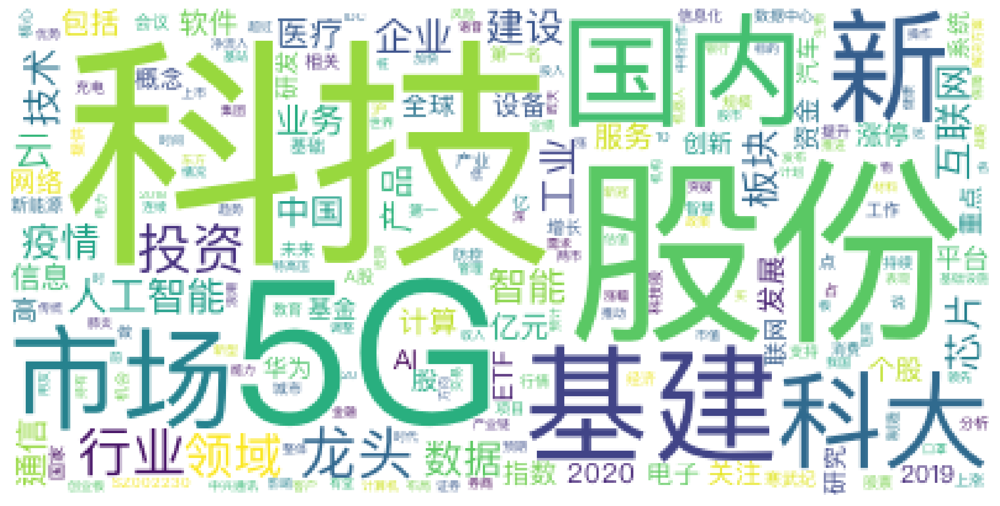

In [93]:
# plot_wc(wc)

In [14]:
plot_wc(wocld('xueqiu_kdxf.txt'))

[('科技', 3005), ('股份', 1834), ('5G', 1827), ('基建', 1679), ('国内', 1580), ('新', 1574), ('市场', 1536), ('科大', 1455), ('龙头', 1361), ('行业', 1271)]


In [17]:
plot_wc(wocld('xueqiu_kdxf.txt'))

[('科技', 3005), ('股份', 1834), ('5G', 1827), ('基建', 1679), ('国内', 1580), ('新', 1574), ('市场', 1536), ('科大', 1455), ('龙头', 1361), ('行业', 1271)]
